In [1]:
from UnetDetect import getUnet, shape_detect
from UnetDetect import DoubleConv, Down, Up, OutConv, UNet
from yoloDetect import seg_by_label
from segfunct import minCornerDistance, edge_segment
import numpy as np
import pandas as pd

In [2]:
seg_imgs, boxs, positions = seg_by_label(r'content\DATA_unlabel\06253001\06253001_FILE2.bmp', r'content\pred_result\06253001\labels\06253001_FILE2.txt')

# seg_imgs, boxs, positions = seg_by_label(r'content\DATA_unlabel\06253001\06253001_FILE1.bmp', r'content\pred_result\06253001\labels\06253001_FILE1.txt')

# seg_imgs, boxs, positions = seg_by_label(r'content\DATA\9999999999\01990231_FILE3.bmp', r'testResult\9999999999\labels\01990231_FILE3.txt')

# 'testmasked\\test' + str(idx) + '.txt'

pred = []
pred1 = []
pred2 = []

# md = getUnet(md_path = r'C:\Users\user\OneDrive\桌面\vertex\weights\Unet\unet0328H.opt')
# for idx, seg_img in enumerate(seg_imgs):
#     pred.append(shape_detect(seg_img, md, Histeq=False, Snake=False, save_path=None, img_size=224, t=0.7))

md = getUnet(md_path = r'C:\Users\user\OneDrive\桌面\vertex\weights\Unet\unet0424H.opt')
for idx, seg_img in enumerate(seg_imgs):
    pred1.append(shape_detect(seg_img, md, Snake=False, save_path=None, img_size=224, t=0.7))

md = getUnet(md_path = r'C:\Users\user\OneDrive\桌面\vertex\weights\Unet\unet0425H.opt')
for idx, seg_img in enumerate(seg_imgs):
    pred2.append(shape_detect(seg_img, md, Snake=False, save_path=None, img_size=256, t=0.7))

pred = [(p1 + p2)/2 for p1, p2 in zip(pred1, pred2)]

for i in range(len(pred1)):
    np.savetxt('testmasked\\test' + str(i) + '.txt', pred[i], fmt='%d')

In [3]:
# import torch

# md = torch.load(r'C:\Users\user\OneDrive\桌面\vertex\weights\Unet\unet0424H.opt', map_location='cpu')

In [4]:
# from matplotlib import pyplot as plt

# plt.figure()
# plt.title('Loss')
# plt.plot(md['train_loss'])

# plt.figure()
# plt.title('Accuracy')
# plt.plot(md['train_acc'])
# plt.plot(md['test_acc'])
# plt.legend(['train','test'])

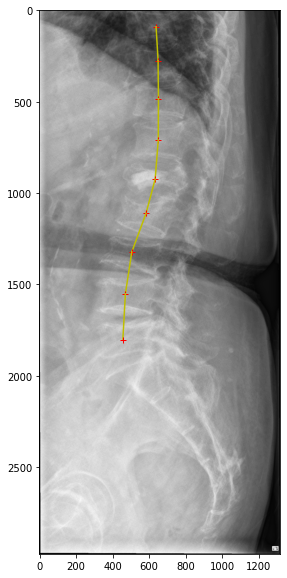

In [35]:
from matplotlib import pyplot as plt

plt.figure(figsize=(20,10))
plt.imshow(Image.open(r'content\DATA_unlabel\06253001\06253001_FILE2.bmp'), cmap='gray')

for idx in range(len(boxs)):
    xc1, yc1 = (boxs[idx][0]+boxs[idx][2])/2, (boxs[idx][1]+boxs[idx][3])/2
    
    plt.plot(xc1, yc1, 'r+')

    if idx != len(boxs)-1:
        xc2, yc2 = (boxs[idx+1][0]+boxs[idx+1][2])/2, (boxs[idx+1][1]+boxs[idx+1][3])/2
        plt.plot([xc1, xc2], [yc1, yc2], 'y-')

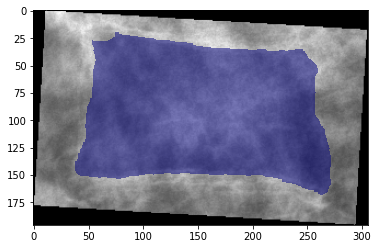

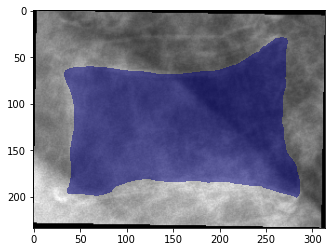

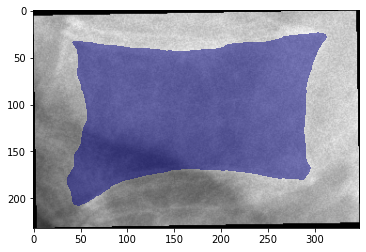

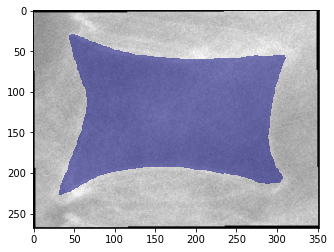

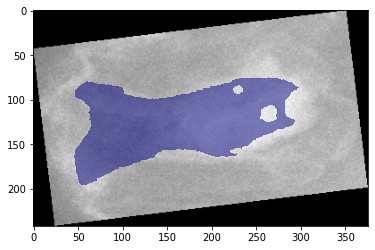

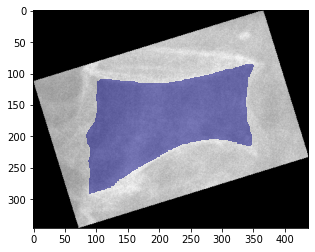

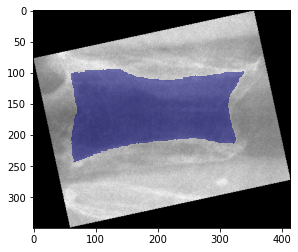

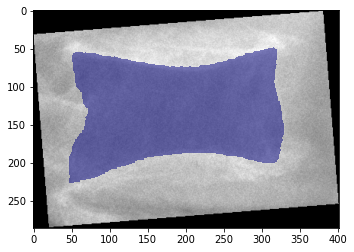

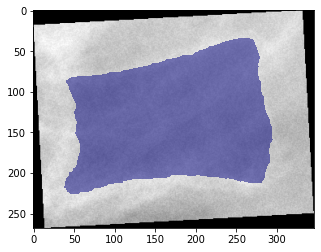

In [36]:
import numpy as np
import math
from PIL import Image
import torchvision.transforms.functional as TF

centers = [((box[0]+box[2])/2, (box[1]+box[3])/2) for box in boxs]

fs = os.listdir('testmasked')
degrees = [] # save rotation degree
fs.sort(key=lambda x: int(x[4:].split('.')[0]))

for idx, (f, seg_img) in enumerate(zip(fs, seg_imgs)):
    msk = np.loadtxt(os.path.join('testmasked', f))
    plt.figure()
    plt.imshow(seg_img, cmap='gray')
    plt.imshow(np.ma.masked_where(msk==0, msk), cmap='jet', alpha=0.5)

    a1, a2 = None, None
    x1, y1 = centers[idx]
    X = np.linspace(-500,500)
    if idx != 0:
        x0, y0 = centers[idx-1]       
        
        a1 = (y1-y0)/(x1-x0)
        b1 = seg_img.size[1]/2 - a1 * seg_img.size[0]/2

        # plt.plot(X, a1*X+b1)
   
    if idx < len(centers)-1:
        x2, y2 = centers[idx+1]

        a2 = (y2-y1)/(x2-x1)
        b2 = seg_img.size[1]/2 - a2 * seg_img.size[0]/2

        # plt.plot(X, a2*X+b2)

    if a1 != None and a2 != None:
        a = (a1 + a2)/2
        b = seg_img.size[1]/2 - a * seg_img.size[0]/2

        # plt.plot(X, a*X+b)
        d = 90-math.degrees(math.atan(a))
    elif a1 != None:
        d = 90-math.degrees(math.atan(a1))
    elif a2 != None:
        d = 90-math.degrees(math.atan(a2))

    degrees.append(d)
    plt.imshow(TF.rotate(seg_img, -d, expand=True), cmap='gray')
    msk = np.array(TF.rotate(Image.fromarray(msk), -d, expand=True))
    plt.imshow(np.ma.masked_where(msk==0, msk), cmap='jet', alpha=0.5)

    # plt.xlim([0,seg_img.size[0]])
    # plt.ylim([seg_img.size[1],0])
    # plt.plot(x0, y0, 'r+')

In [6]:
print(degrees)

[3.402769771061756, 0.9444683228196027, 179.056944767529, 179.5197211843606, 173.0252433514142, 162.8104452842636, 167.7969530712375, 175.36809775026433, 176.845157135208]


In [7]:
from segfunct import get_angle
get_angle(boxs)

(638.0, 90.0)
16.818181818181817
(649.0, 275.0)
60.65909090909091
(651.0, 484.0)
-60.75
(650.0, 710.0)
-119.29411764705883
(633.0, 924.0)
-8.174117647058823
(583.0, 1112.0)
-3.2325641025641025
(505.0, 1323.0)
-4.623992673992674
(470.0, 1552.0)
-12.342857142857142
(456.0, 1806.0)
-18.142857142857142


[3.402769771061756,
 0.9444683228196027,
 179.056944767529,
 179.5197211843606,
 173.0252433514142,
 162.8104452842636,
 167.7969530712375,
 175.36809775026433,
 176.845157135208]

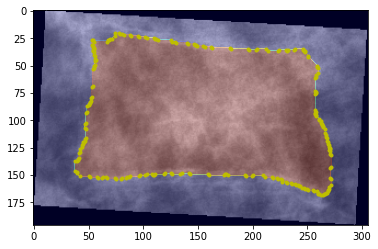

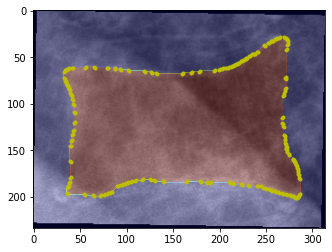

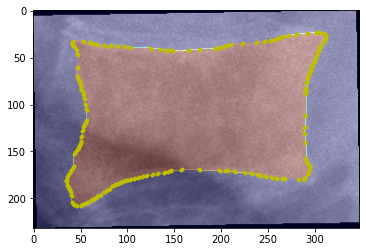

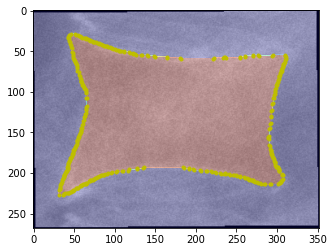

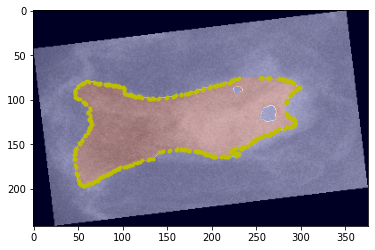

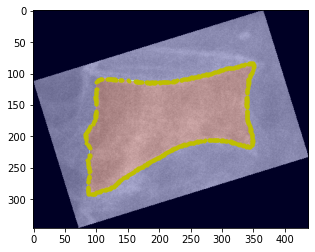

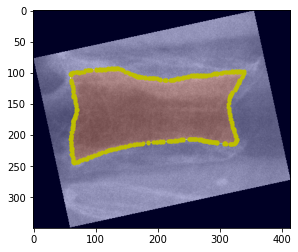

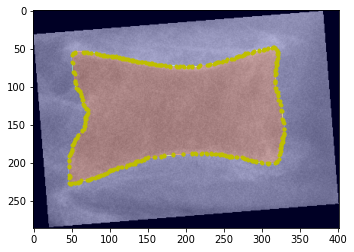

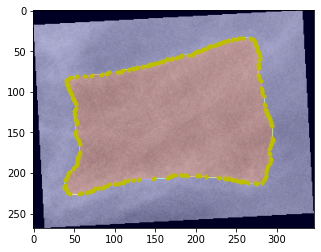

In [8]:
import numpy as np
import cv2

from matplotlib import pyplot as plt

fdir = 'testmasked'
for fname, d, seg_img in zip(fs, degrees, seg_imgs):
    binary = np.loadtxt(os.path.join(fdir, fname), dtype=np.uint8)
    
    # ratation
    binary = np.array(TF.rotate(Image.fromarray(binary), -d, expand=True))
    seg_img = TF.rotate(seg_img, -d, expand=True)
    
    # plt.imshow(cv2.Canny(binary, 100, 200), alpha=0.3)
    contours, hierarchy = cv2.findContours(binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # several cluster of contours may be found
    if len(contours) > 1:
        contours.sort(key=lambda x: x.shape[0], reverse=True)
        contours = contours[0]

    conts = np.squeeze(np.array(contours))
    
    fig = plt.figure()
    plt.imshow(seg_img, cmap='gray')
    plt.imshow(binary, alpha=0.3, cmap='jet')
    for cont in conts:
        plt.plot(cont[0], cont[1], 'y.')


3.402769771061756
-0.05938953619236131
16.8181818181818
0.9444683228196027
-0.016484081913990763
60.65909090909168
179.056944767529
-3.1251332347550136
-60.749999999999396
179.5197211843606
-3.133210206929307
-119.29411764706201
173.0252433514142
-3.0198601855466056
-8.174117647058836
162.8104452842636
-2.841578326848475
-3.232564102564101
167.7969530712375
-2.928609305907506
-4.62399267399268
175.36809775026433
-3.0607507087013732
-12.342857142857216
176.845157135208
-3.086530258216123
-18.142857142857228


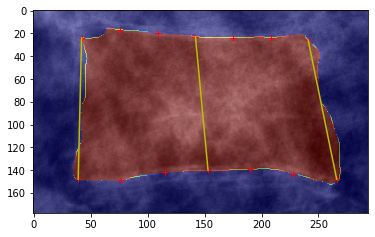

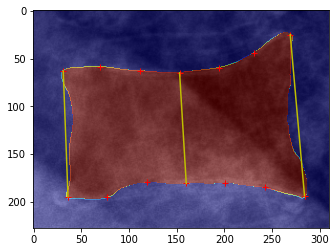

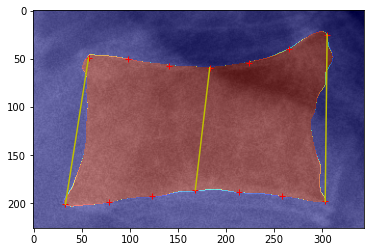

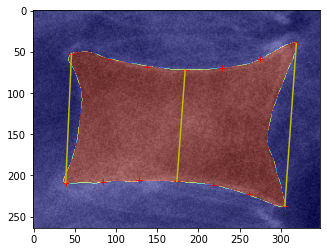

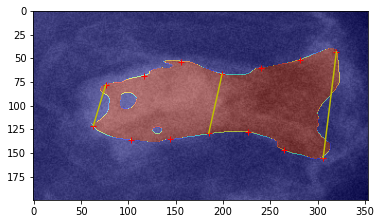

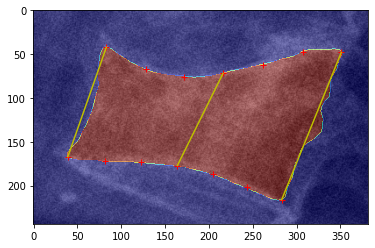

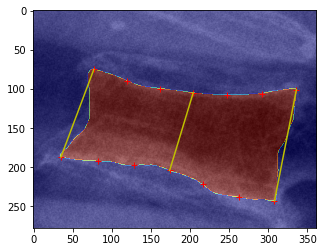

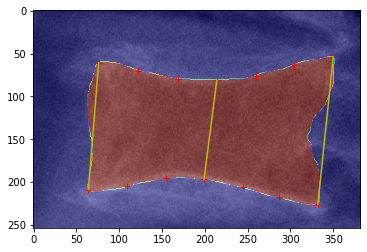

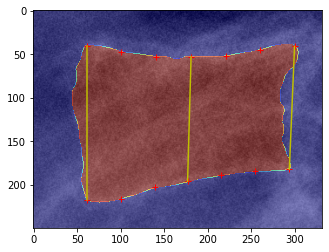

In [41]:
feature = []

fdir = 'testmasked'
for fname, d, seg_img in zip(fs, degrees, seg_imgs):

    print(d)

    binary = np.loadtxt(os.path.join(fdir, fname), dtype=np.uint8)
    
    # ratation
    # seg_img = TF.rotate(seg_img, -d, expand=True)

    cs = minCornerDistance(binary, angle=-d)

    plt.figure()
    plt.imshow(seg_img, cmap='gray')
    plt.imshow(np.array(Image.fromarray(binary)), alpha=0.3, cmap='jet')
    
    us = edge_segment(cs[0], cs[2], binary, angle=0, n=6)
    ds = edge_segment(cs[1], cs[3], binary, angle=0, upper=False, n=6)

    for idx, (u, d) in enumerate(zip(us, ds)):
        plt.plot(*u, 'r+')
        plt.plot(*d, 'r+')
        if idx%3 == 0:
            plt.plot([u[0], d[0]], [u[1], d[1]], 'y-')
    # colors = ['r+','g+','b+','y+']
    # for c, color in zip(cs, colors):
    #     plt.plot(*c, color)

    feature.append(np.sqrt(np.sum(np.square(np.array(us) - np.array(ds)), axis=1)))

df2 = pd.DataFrame(feature, columns=['Len{}'.format(i) for i in range(7)])

In [10]:
df2['Len_ratio0'] = df2['Len1']/df2['Len0']
df2['Len_ratio1'] = df2['Len3']/df2['Len0']
df2['Len_ratio2'] = df2['Len5']/df2['Len0']
# df2['Len_ratio3'] = df2['Len7']/df2['Len0']
df2['pos_encode'] = np.array([1 if 'T' in p else 0 for p in positions])
df2.head()

,Len0,Len1,Len2,Len3,Len4,Len5,Len6,Len_ratio0,Len_ratio1,Len_ratio2,pos_encode
0,124.036285,132.003788,122.147452,117.515956,115.974135,120.668969,124.535136,1.064235,0.947432,0.972852,1
1,132.094663,136.180028,116.211015,116.211015,120.203993,141.509717,169.664375,1.030928,0.879756,1.071275,1
2,153.883072,150.336290,136.194714,127.882759,134.450734,152.161099,173.011560,0.976951,0.831039,0.988810,1
3,157.155973,149.214611,138.361844,135.369864,141.428427,164.596476,197.496835,0.949468,0.861373,1.047345,1
4,44.922155,68.447060,81.884064,63.560994,69.231496,96.337947,112.871608,1.523682,1.414914,2.144553,0


In [11]:
import pickle

with open('./MLmodel.pickle', 'rb') as f:
    mds = pickle.load(f)

preds = []
for i in range(len(mds)):
    preds.append(mds[i]['dec'].predict(df2.drop(['Len1','Len2','Len4','Len5'], axis=1)))

preds = np.where(np.sum(np.array(preds).T, axis=1) > 3, 1, 0)

idxs = []
for idx, pred in enumerate(preds):
    if pred == 0:
        idxs.append(idx)

In [12]:
print(preds)

[1 1 1 1 0 1 1 1 1]


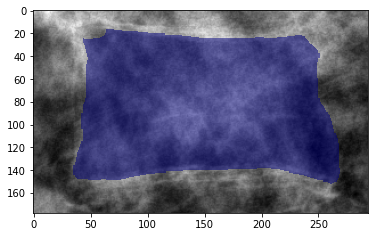

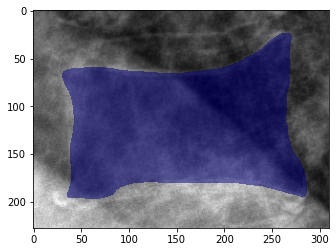

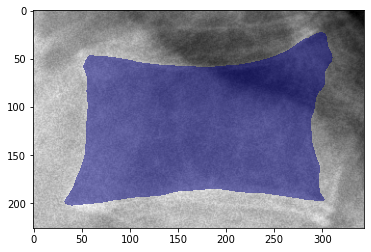

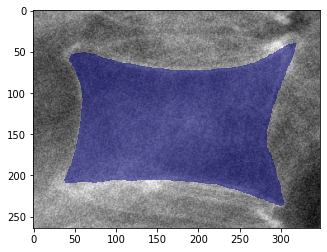

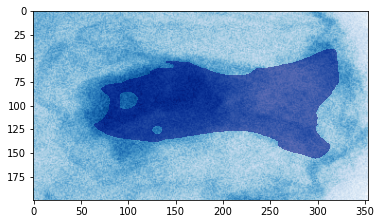

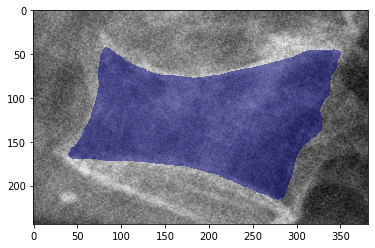

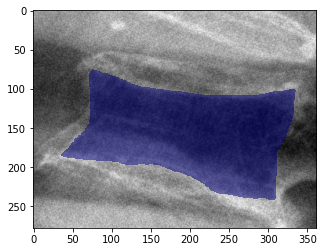

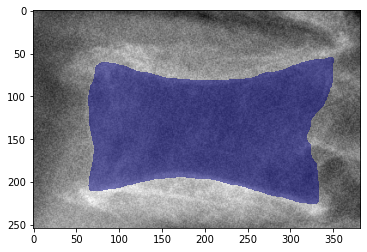

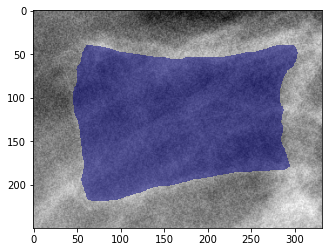

In [13]:
for f, i in zip(fs, range(len(seg_imgs))):
    color = 'gray' if not i in idxs else 'Blues'
    plt.figure()
    plt.imshow(seg_imgs[i], cmap=color)
    a = np.loadtxt(os.path.join('testmasked', f))
    plt.imshow(np.ma.masked_where(a==0, a), cmap='jet', alpha=0.5)

In [14]:
df2.describe()

,Len0,Len1,Len2,Len3,Len4,Len5,Len6,Len_ratio0,Len_ratio1,Len_ratio2,pos_encode
count,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
mean,132.079090,129.372093,119.138842,115.686531,122.740555,141.488051,157.513425,1.021564,0.920451,1.162509,0.444444
std,37.281069,29.259088,20.641063,22.802517,22.121270,22.522720,28.061738,0.197907,0.191041,0.389663,0.527046
min,44.922155,68.447060,81.884064,63.560994,69.231496,96.337947,112.871608,0.868102,0.787724,0.790508,0.000000
25%,124.036285,115.039124,109.128365,116.211015,117.881296,135.366170,141.127602,0.913384,0.831039,0.988810,0.000000
50%,132.517923,135.624482,116.211015,117.170815,130.980915,141.509717,169.664375,0.960227,0.864814,1.050131,0.000000
75%,153.883072,149.214611,136.194714,127.882759,137.131324,155.929471,173.011560,1.030928,0.884188,1.131672,1.000000
max,176.000000,169.000000,150.013333,143.055933,141.428427,167.693172,197.496835,1.523682,1.414914,2.144553,1.000000


successfully load model of type <class 'list'>
0.05938953619236131
-16.818181818181834
1.0
0.016484081913990763
-60.65909090909131
0.8571428571428571
3.1251332347550136
60.749999999999766
1.0
3.133210206929307
119.2941176470571
0.8571428571428571
3.0198601855466056
8.174117647058857
0.5714285714285714
2.841578326848475
3.232564102564105
1.0
2.928609305907506
4.623992673992687
1.0
3.0607507087013732
12.34285714285723
0.8571428571428571
3.086530258216123
18.14285714285741
1.0


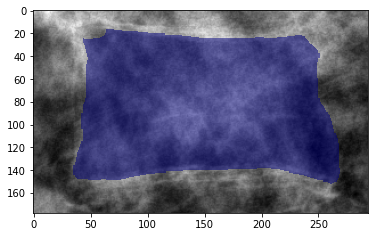

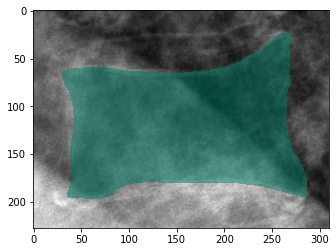

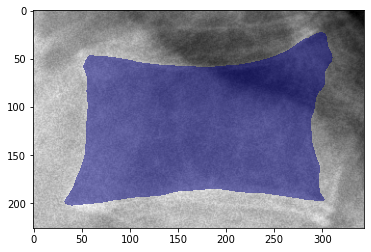

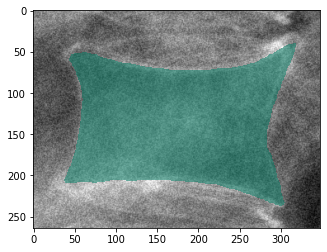

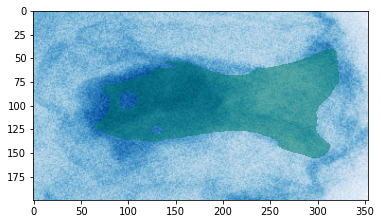

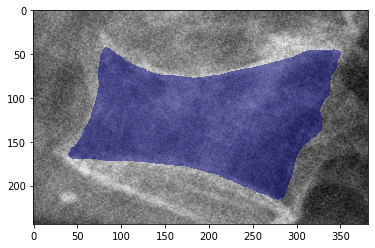

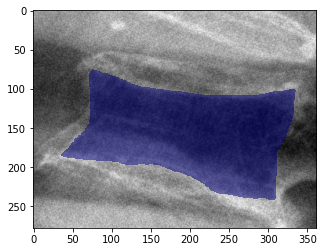

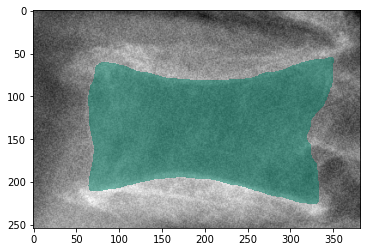

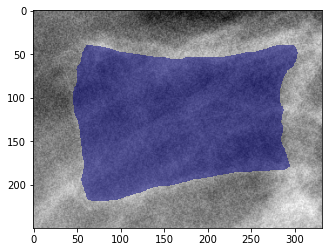

In [15]:
from fractDetect import get_fmodel, fracturePredict
import numpy as np

mds = get_fmodel('MLmodel.pickle')

for f, i, d in zip(fs, range(len(seg_imgs)), degrees):
    color = 'gray' if not i in idxs else 'Blues'
    plt.figure()
    plt.imshow(seg_imgs[i], cmap=color)
    a = np.loadtxt(os.path.join('testmasked', f))

    cs, us, ds, p = fracturePredict(a, 'T', mds, angle=d)
    print(p)
    col = 'jet' if p == 1 else 'summer'
    plt.imshow(np.ma.masked_where(a==0, a), cmap=col, alpha=0.5)


In [16]:
from screwDetect import screwPredict, get_scew_model, BuildModel

import torch
from torchvision import transforms
import torchvision.transforms.functional as TF

# md = get_scew_model(r'C:\Users\user\OneDrive\桌面\vertex\weights\Alexnet\screw_clf(2).pt')
md = torch.load(r'C:\Users\user\OneDrive\桌面\vertex\weights\Alexnet\screw_clf(2).pt', map_location = torch.device('cpu'))

data = torch.cat([TF.to_tensor(TF.resize(seg_img, [224,224])) for seg_img in seg_imgs])

md.eval()

torch.argmax(md(data.unsqueeze(1)), axis=1)
# print(screwPredict(seg_imgs, md))

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0])